In [16]:
from pydoc import help 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE


# Algunos ejemplos de ACP

## Cancer

In [2]:
url="https://raw.githubusercontent.com/Cruzalirio/Ucentral/master/Bases/Cancer.csv"
cancer=pd.read_csv(url, sep=";", decimal=",", index_col=0)
cancer

,Tipo,Radio,Textura,Perimetro,Area,Suavidad,Compacidad,Concavidad,Puntos_Conca,Simetria,...,Radio_WM,Textura_WM,Perimetro_WM,Area_WM,Suavidad_WM,Compacidad_WM,Concavidad_WM,Puntos_Conca_WM,Simetria_WM,Fractal_WM
ID,,,,,,,,,,,,,,,,,,,,,
842302,M,1799,1038,1228,1001,1184,2776,3001,1471,2419,...,2538,1733,1846,2019,1622,6656,7119,2654,4601,1189
842517,M,2057,1777,1329,1326,8474,7864,869,7017,1812,...,2499,2341,1588,1956,1238,1866,2416,186,275,8902
84300903,M,1969,2125,130,1203,1096,1599,1974,1279,2069,...,2357,2553,1525,1709,1444,4245,4504,243,3613,8758
84348301,M,1142,2038,7758,3861,1425,2839,2414,1052,2597,...,1491,265,9887,5677,2098,8663,6869,2575,6638,173
84358402,M,2029,1434,1351,1297,1003,1328,198,1043,1809,...,2254,1667,1522,1575,1374,205,4,1625,2364,7678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
926424,M,2156,2239,142,1479,111,1159,2439,1389,1726,...,2545,264,1661,2027,141,2113,4107,2216,206,7115
926682,M,2013,2825,1312,1261,978,1034,144,9791,1752,...,2369,3825,155,1731,1166,1922,3215,1628,2572,6637
926954,M,166,2808,1083,8581,8455,1023,9251,5302,159,...,1898,3412,1267,1124,1139,3094,3403,1418,2218,782


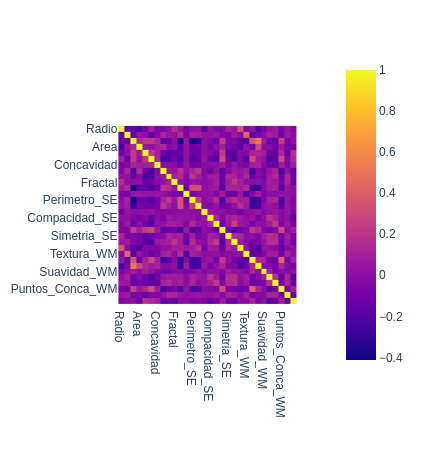

In [3]:
corre=cancer.corr()
fig=px.imshow(corre)
fig.show()

In [5]:
cuanti=cancer.select_dtypes(np.number)
escala=StandardScaler()
escala.fit(cuanti)
CuantiScale=escala.transform(cuanti)
pd.DataFrame(CuantiScale,columns=cuanti.columns)

,Radio,Textura,Perimetro,Area,Suavidad,Compacidad,Concavidad,Puntos_Conca,Simetria,Fractal,...,Radio_WM,Textura_WM,Perimetro_WM,Area_WM,Suavidad_WM,Compacidad_WM,Concavidad_WM,Puntos_Conca_WM,Simetria_WM,Fractal_WM
0,-0.042342,-1.127588,-1.264558,-1.343092,-1.072719,-0.403428,-0.071597,-0.790419,1.402273,1.170725,...,0.511497,-0.628045,-0.747981,-0.910078,-0.087584,1.602799,1.582953,-0.297216,1.939390,-1.703623
1,0.077376,0.004834,-1.234882,-1.208370,0.791906,1.300361,-0.912031,1.186601,0.299696,-0.001608,...,0.485968,0.011499,-0.818418,-0.934004,-0.270929,-0.530977,-0.388545,-1.141506,-2.212601,0.891622
2,0.036542,0.538099,-1.587172,-1.259357,-1.095227,-0.797563,-0.476440,-0.858863,0.766520,0.174987,...,0.393013,0.234497,-0.835618,-1.027808,-0.172572,0.528784,0.486745,-1.122006,0.991132,0.843169
3,-0.347206,0.404783,0.654089,-0.157535,-1.011076,-0.382331,-0.302993,-0.939783,1.725599,2.166995,...,-0.173876,-2.172205,1.447312,0.479136,0.139688,2.496847,1.478153,-0.324242,3.894454,-2.045483
4,0.064384,-0.520769,-1.228418,-1.220391,-1.119014,-0.888311,-1.176539,-0.942992,0.294247,0.113285,...,0.325589,-0.697469,-0.836437,-1.078698,-0.205994,-1.270894,-1.399655,-0.649232,-0.207629,0.479774
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,0.123315,0.712789,-1.583646,-1.144946,-1.347169,-0.944903,-0.293138,-0.819651,0.143483,-0.025012,...,0.516079,-2.173257,-0.798489,-0.907040,-0.794704,-0.420947,0.320323,-0.447054,-2.278826,0.290338
565,0.056959,1.610759,-1.239877,-1.235314,-1.125409,-0.986761,-1.197826,2.175468,0.190710,-0.072884,...,0.400869,1.572489,-1.209645,-1.019453,-0.305306,-0.506031,-0.053604,-0.648205,-0.007995,0.129502
566,-0.800093,1.584708,-1.307162,1.799049,0.787046,-0.990445,2.392150,0.575243,-2.702874,-0.011714,...,0.092549,1.138063,-0.906055,-1.249976,-0.318198,0.016054,0.025206,-0.720045,-0.347756,-1.840569
567,-0.781532,1.776255,-1.213727,-1.233656,-1.074253,-1.240253,0.130627,-1.260612,1.362312,0.715941,...,0.535063,1.695559,-0.747981,-0.985274,-0.783245,2.504866,2.533699,-1.114480,1.446065,-2.061970


In [10]:
pca=PCA(0.6) # Otra opcion pca=PCA(.85)
pca.fit(CuantiScale) # Saca las valores y vectores propios
cuanti_pca=pca.transform(CuantiScale)

In [11]:
pca.components_.shape

(12, 30)

In [12]:
print("Ajuste de PCA", CuantiScale.shape)
expl = pca.explained_variance_ratio_
print(expl)
print('suma:',sum(expl[0:30]))

Ajuste de PCA (569, 30)
[0.13822172 0.06611884 0.06397476 0.04948872 0.04299583 0.04179741
 0.04100825 0.03685034 0.03420341 0.03324367 0.03169931 0.03124475]
suma: 0.6108470104171457


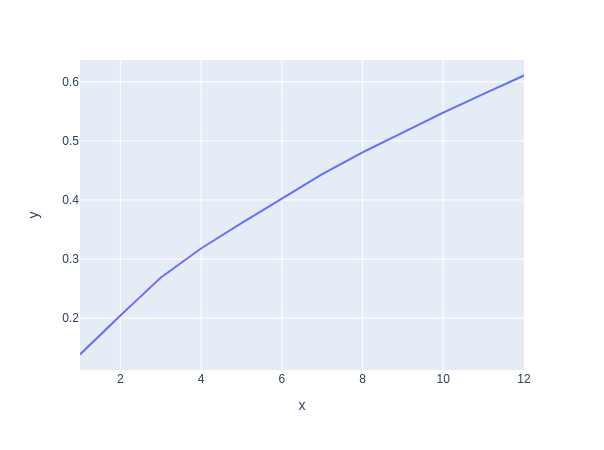

In [13]:
a=len(pca.components_)+1
y=range(1,a)
fig=px.line(x=y, y=np.cumsum(pca.explained_variance_ratio_))
fig.show()

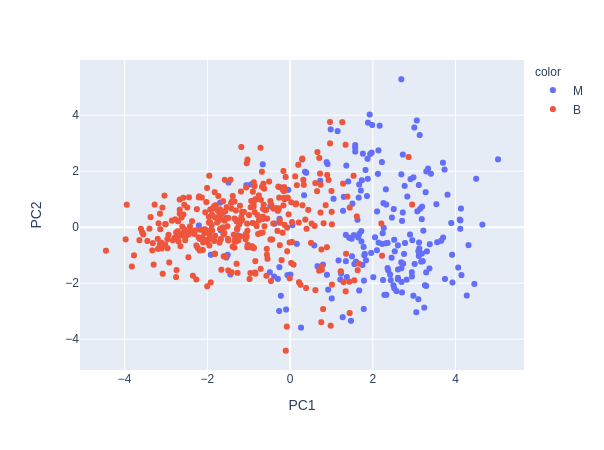

In [14]:
ACP=[]
for i in range(0, len(pca.components_)):
  x=["PC", str(i+1)]
  a="".join(x)
  ACP.append(a)
  
Pca_Tra=pd.DataFrame(cuanti_pca, index=cancer.index, columns=ACP)
fig=px.scatter(Pca_Tra, x="PC1", y="PC2", color=cancer.Tipo)
fig.show()

In [26]:
from time import time
perplexity=30


t0 = time()
tsne = TSNE(n_components=2, init='random',
                         random_state=0, perplexity=perplexity)
Y = tsne.fit_transform(CuantiScale)
t1 = time()
print("Con perplejidad %d se demoro %.2g sec" % (perplexity, t1 - t0))

Tsne_Tra=pd.DataFrame(Y, index=cancer.index, columns=['comp1','comp2'])
Tsne_Tra['Type']=cancer['Tipo']
Tsne_Tra

Con perplejidad 30 se demoro 4.5 sec


,comp1,comp2,Type
ID,,,
842302,19.780142,17.698298,M
842517,21.728062,4.905991,M
84300903,21.848515,10.800105,M
84348301,1.449322,15.804098,M
84358402,22.562836,10.104693,M
...,...,...,...
926424,22.677502,20.007553,M
926682,21.629492,7.453047,M
926954,12.368326,5.643592,M


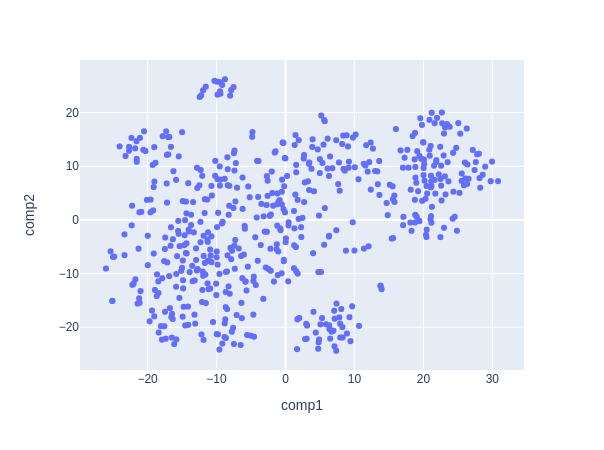

In [30]:
fig=px.scatter(Tsne_Tra, x="comp1", y="comp2")
fig.show()

In [32]:
from ipywidgets import interact,IntSlider

def tsne(perplexity):
    t0 = time()
    tsne = TSNE(n_components=2, init='random',
                             random_state=0, perplexity=perplexity)
    Y = tsne.fit_transform(CuantiScale)
    t1 = time()
    print("Con perplejidad %d se demoro %.2g sec" % (perplexity, t1 - t0))

    Tsne_Tra=pd.DataFrame(Y, index=cancer.index, columns=['comp1','comp2'])
    Tsne_Tra['Type']=cancer['Tipo']
    fig=px.scatter(Tsne_Tra, x="comp1", y="comp2", color="Type",range_x=(-60,80),range_y=(-80,80))
    fig.show()

w1=IntSlider(min=5,max=100,value=30)

interact(tsne,perplexity=w1)

interactive(children=(IntSlider(value=30, description='perplexity', min=5), Output()), _dom_classes=('widget-i…

<function __main__.tsne(perplexity)>

## Compresión de imagenes



In [12]:
!pip install scikit-image

     |████████████████████████████████| 30.2 MB 8.2 MB/s eta 0:00:01
     |████████████████████████████████| 3.3 MB 8.5 MB/s eta 0:00:01
     |████████████████████████████████| 159 kB 15.4 MB/s eta 0:00:01


In [13]:
from skimage import io
from skimage import color
from matplotlib import image
url="http://www.effigis.com/wp-content/uploads/2015/02/Airbus_Pleiades_50cm_8bit_RGB_Yogyakarta.jpg"
imagen=io.imread(url)

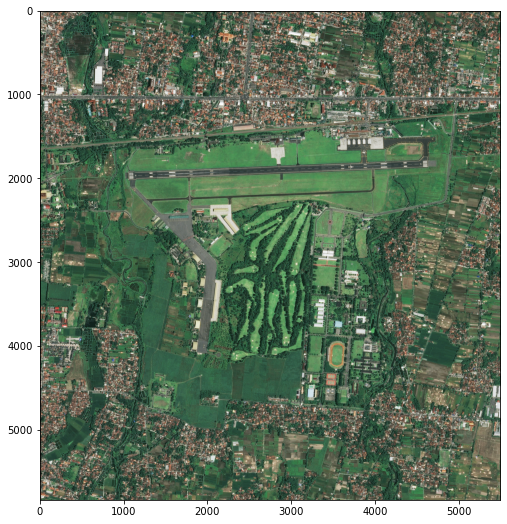

In [14]:
plt.rcParams['figure.figsize'] = (16, 9)
plt.imshow(imagen) 

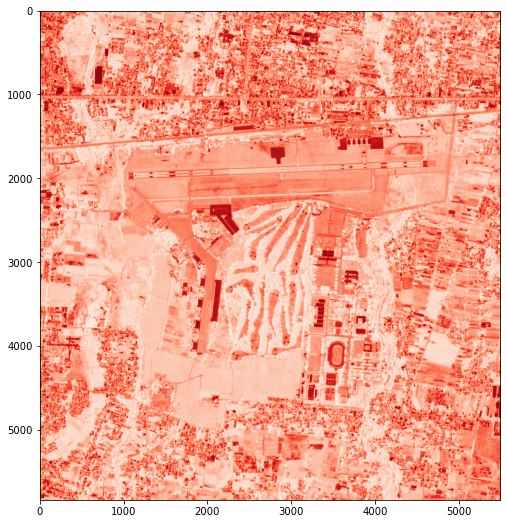

In [15]:
plt.rcParams['figure.figsize'] = (16, 9)
rojo=imagen[:,:,0]
plt.imshow(rojo, cmap="Reds") 

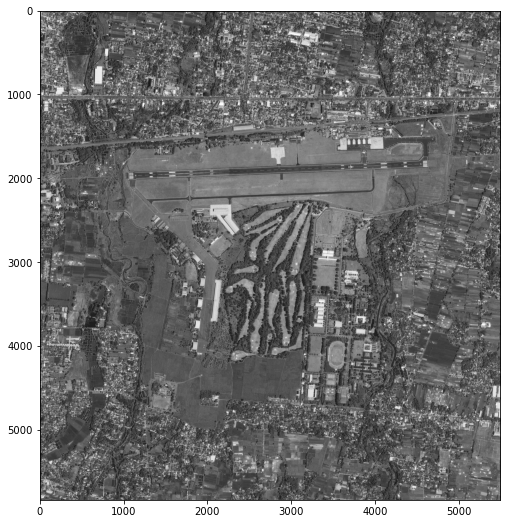

In [16]:
plt.rcParams['figure.figsize'] = (16, 9)
imagengris=color.rgb2gray(imagen)
imagengris.shape
plt.imshow(imagengris, cmap='gray')

In [17]:
IMGris=pd.DataFrame(imagengris)
IMGris

,0,1,2,3,4,5,6,7,8,9,...,5484,5485,5486,5487,5488,5489,5490,5491,5492,5493
0,0.676719,0.631878,0.582052,0.346966,0.303270,0.343357,0.397456,0.488507,0.491022,0.447610,...,0.234111,0.325156,0.310043,0.272509,0.500377,0.332478,0.105288,0.078402,0.143693,0.235325
1,0.837824,0.754891,0.533549,0.232102,0.233508,0.374462,0.465246,0.550694,0.532210,0.432467,...,0.342018,0.341445,0.254873,0.231909,0.377893,0.184553,0.063282,0.111732,0.162727,0.246257
2,0.776203,0.744257,0.398764,0.199621,0.258979,0.429631,0.484548,0.455423,0.437795,0.419831,...,0.509835,0.457135,0.249798,0.199100,0.262716,0.132181,0.047610,0.106121,0.191615,0.268662
3,0.737507,0.773115,0.369035,0.171276,0.285865,0.428493,0.460431,0.413960,0.413380,0.387320,...,0.686082,0.566471,0.325193,0.233858,0.255744,0.143410,0.083731,0.109209,0.185186,0.238414
4,0.794366,0.758239,0.355046,0.234587,0.355329,0.427927,0.430502,0.415321,0.385058,0.385921,...,0.712432,0.609660,0.346811,0.251822,0.196035,0.130507,0.093278,0.107825,0.236770,0.189979
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5834,0.203716,0.343018,0.494085,0.499375,0.480043,0.480288,0.393380,0.280696,0.223814,0.223814,...,0.483210,0.462203,0.432215,0.396615,0.386242,0.380363,0.394085,0.417064,0.401378,0.389598
5835,0.458783,0.444511,0.478101,0.500476,0.512301,0.531344,0.470747,0.294187,0.206438,0.241732,...,0.412033,0.422987,0.417629,0.388474,0.370571,0.449002,0.394100,0.385691,0.386257,0.397173
5836,0.512094,0.422060,0.530571,0.659446,0.517904,0.367030,0.356947,0.294722,0.225778,0.261340,...,0.304982,0.346476,0.394673,0.399160,0.449865,0.469473,0.384285,0.364677,0.390164,0.368598
5837,0.387332,0.343598,0.586596,0.636750,0.342399,0.230281,0.265865,0.257151,0.233316,0.266682,...,0.333304,0.319025,0.338633,0.394375,0.401407,0.369179,0.320974,0.313964,0.317603,0.331340


In [31]:
5839*5494

32079466

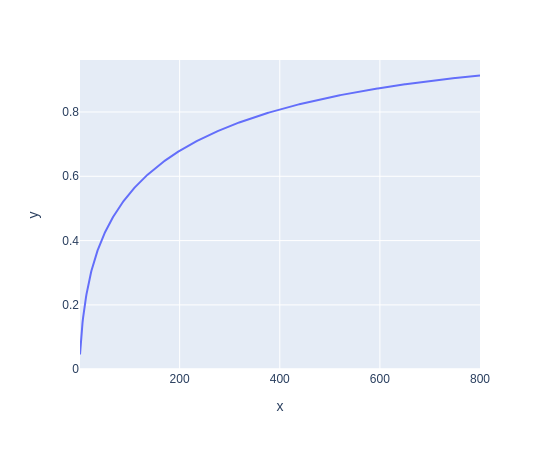

In [22]:
escala=StandardScaler(with_std=False)
escala.fit(IMGris)
DD=escala.transform(IMGris)
IMPca=PCA(n_components=800)
IMPca.fit(DD)
a=len(IMPca.components_)+1
y=range(1,a)
fig=px.line(x=y, y=np.cumsum(IMPca.explained_variance_ratio_))
fig.show()


In [24]:
IMPca.fit(DD)

PCA(n_components=800)

In [28]:
Y=IMPca.transform(DD)
W=IMPca.components_
media=np.array(IMGris.mean())

In [29]:
Y.shape

(5839, 800)

In [32]:
5839*800

4671200

In [33]:
IResta=np.dot(Y,W)
IResta.shape
for i in range(IResta.shape[0]):
  IResta[i,:]=IResta[i,:]+media
IResta.shape

(5839, 5494)

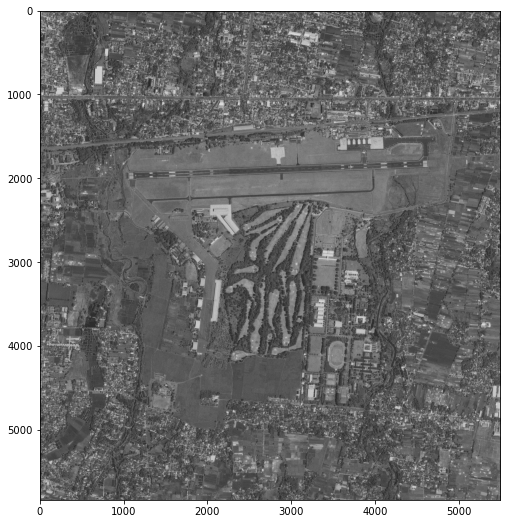

In [34]:
plt.rcParams['figure.figsize'] = (16, 9)
plt.imshow(IResta, cmap='gray')

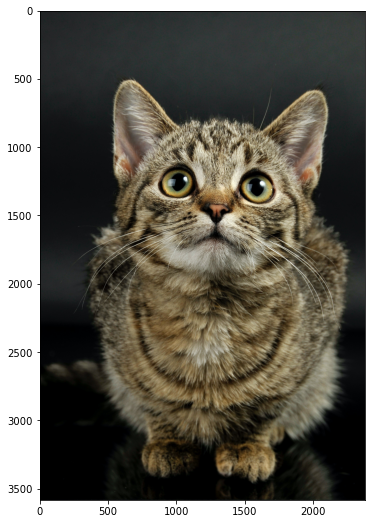

In [35]:
from skimage import io
from skimage import color
from matplotlib import image
url="https://raw.githubusercontent.com/Cruzalirio/Ucentral/master/pexels-wojciech-kumpicki-2071881.jpg"
imagen=io.imread(url)
plt.rcParams['figure.figsize'] = (16, 9)
plt.imshow(imagen) 

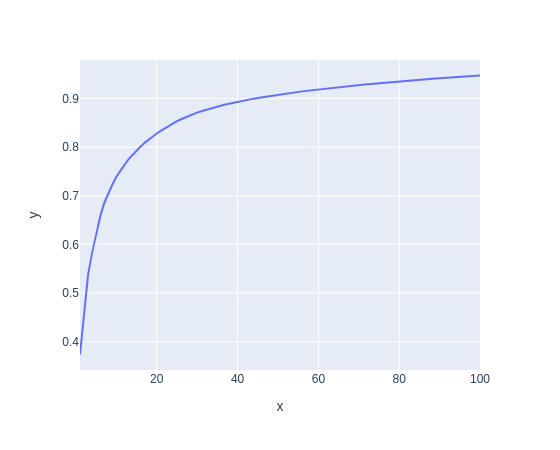

In [43]:
imagengris=color.rgb2gray(imagen)
IMGris=pd.DataFrame(imagengris)
escala=StandardScaler(with_std=False)
escala.fit(IMGris)
DD=escala.transform(IMGris)
IMPca=PCA(n_components=100)
IMPca.fit(DD)
a=len(IMPca.components_)+1
y=range(1,a)
fig=px.line(x=y, y=np.cumsum(IMPca.explained_variance_ratio_))
fig.show()

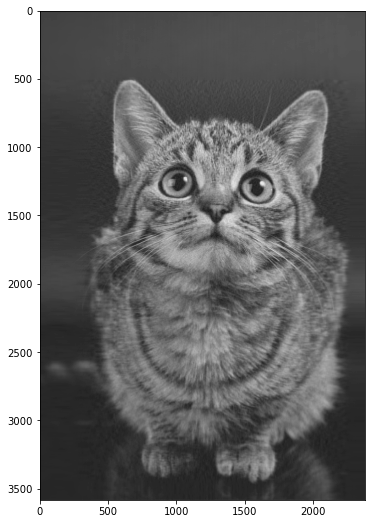

In [44]:
Y=IMPca.transform(DD)
W=IMPca.components_
media=np.array(IMGris.mean())
IResta=np.dot(Y,W)
IResta.shape
for i in range(IResta.shape[0]):
  IResta[i,:]=IResta[i,:]+media
plt.rcParams['figure.figsize'] = (16, 9)
plt.imshow(IResta, cmap='gray')

In [42]:
45/2000

0.0225

#  tSNE (t-distributed Stochastic Neighbor Embedding.)

In [ ]:
from sklearn.manifold import TSNE
tsn= TSNE(n_components=2)


In [ ]:
cancer1=tsn.fit_transform(cuanti)
tsn.kl_divergence_

In [ ]:
cancer1=pd.DataFrame(cancer1, columns=["C1", "C2"])
fig=px.scatter(cancer1, x="C1", y="C2", color=cancer.Tipo)
fig.show()